# Configuration and Installation

In [18]:
!/usr/bin/env python

from numpy import histogram as nphistogram
from numpy import array, linspace, zeros, ones, ones_like
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure, hist, plot, ion, axes, title
from JSAnimation.IPython_display import display_animation, anim_to_html

from matplotlib import animation as animation


def getHistBinNumAni(data,totalframes=None,showpts=True):
    #ion()
    if totalframes is None:
        totalframes = min(len(data)-1,100)
    fig = figure()
    ax = fig.gca()

    n, bins, patches = hist(data, totalframes, normed=1, facecolor='green', alpha=0.0)
    if showpts:
        junk = plot(data,0.2*ones_like(data),'bo')
    def animate(i):
        n, bins = nphistogram(data, i+1, normed=False)
        #print n
        ax.set_ylim(0,1.1*n.max())
        for j in range(len(n)):
            rect,h = patches[j],n[j]
            #print h.max()
            x = bins[j]
            w = bins[j+1] - x
            rect.set_height(h)
            rect.set_x(x)
            rect.set_width(w)
            rect.set_alpha(0.75)
        #fig.canvas.draw()
    
    ani = animation.FuncAnimation(fig, animate, totalframes, repeat=False)
    return ani

def getHistBinOffsetAni(data,nbins=20,showpts=True):
    offsets = linspace(-0.5,0.5,50)
    totalframes = len(offsets)
    fig = figure()
    ax = fig.gca()

    n, _bins, patches = hist(data, nbins, normed=1, facecolor='green', alpha=0.0)
    if showpts:
        junk = plot(data,0.2*ones_like(data),'bo')
    # Obnoxious: find max number in a bin ever
    nmax = 1
    for i in range(totalframes):
        dx = (data.max() - data.min())/nbins
        _bins = linspace(data.min() - dx + offsets[i]*dx, data.max()+dx + offsets[i]*dx,len(data)+1)
        n, bins = nphistogram(data, bins=_bins, normed=False)
        nmax = max(nmax,n.max())
                               
    def animate(i):
        dx = (data.max() - data.min())/nbins
        # bins go from min - dx to max + dx, then offset.
        _bins = linspace(data.min() - dx + offsets[i]*dx, data.max()+dx + offsets[i]*dx,nbins)
        n, bins = nphistogram(data, bins = _bins, normed=False)
        ax.set_ylim(0,1.1*nmax)
        #ax.set_xlim(data.min()-dx,data.max()+dx)
        binwidth = bins[1] - bins[0]
        ax.set_xlim(bins[0]-binwidth,bins[-1] + binwidth)

        for j in range(len(n)):
            #continue
            rect,h = patches[j],n[j]
            #print h.max()
            x = bins[j]
            w = bins[j+1] - x
            rect.set_height(h)
            rect.set_x(x)
            rect.set_width(w)
            rect.set_alpha(0.75)
        fig.canvas.draw()    
    ani = animation.FuncAnimation(fig, animate, totalframes, repeat=False)
    return ani
#!/usr/bin/env python

from numpy import sqrt, pi, exp

def getKdeGaussianAni(data,totalframes=100, showpts=True):
    fig = figure()
    
    # Let's say 10000 points for the whole thing
    width = data.max() - data.min()
    left, right = data.min(), data.min() + (width)
    left, right = left - (totalframes/100)*width, right + (totalframes/100)*width
    
    ax = axes(xlim=(left,right),ylim=(-0.1,2))
    line, = ax.plot([], [], lw=2)
    if showpts:
        junk = plot(data,ones_like(data)*0.1,'go')

    
    numpts = 10000
    x = linspace(left,right,numpts)
    
    dx = (right-left)/(numpts-1)
    
    def init():
        line.set_data([], [])
        return line,
    
    def gaussian(x,sigma,mu):
        # Why isn't this defined somewhere?! It must be!
        return (1/sqrt(2*pi*sigma**2)) *  exp(-((x-mu)**2)/(2*sigma**2))
    
    def animate(i):
        y = zeros(10000)
        kernelwidth = .02*width*(i+1)
        kernelpts = int(kernelwidth/dx)
        kernel = gaussian(linspace(-3,3,kernelpts),1,0)
        #kernel = ones(kernelpts)
        for d in data:
            center = d - left
            centerpts = int(center/dx)
            bottom = centerpts - int(kernelpts/2)
            top = centerpts+int(kernelpts/2)
            if top - bottom < kernelpts: top = top + 1
            if top - bottom > kernelpts: top = top - 1
            y[bottom:top] += kernel
        ax.set_xlim(x[where(y>0)[0][0]],x[where(y>0)[0][-1]])
        line.set_data(x,y)
        ax.set_ylim(min(0,y.min()),1.1*y.max())
        #title('ymin %s ymax %s'%(y.min(),y.max()))

    
        #sleep(0.1)
        return line,
    ani = animation.FuncAnimation(fig, animate, init_func=init,
                                  frames=totalframes, repeat=False)
    return ani
#FACTOR ME for rect and gaussian
def getKdeRectAni(data,totalframes=100,showpts=True):
    #ion()
    totalframes = 100
    fig = figure()
    
    # Let's say 10000 points for the whole thing
    width = data.max() - data.min()
    left, right = data.min(), data.min() + (width)
    left, right = left - (totalframes/100)*width, right + (totalframes/100)*width
    
    ax = axes(xlim=(left,right),ylim=(-0.1,2))
    line, = ax.plot([], [], lw=2)
    
    numpts = 10000
    x = linspace(left,right,numpts)
    
    dx = (right-left)/(numpts-1)
    
    def init():
        line.set_data([], [])
        return line,

    if showpts:
        junk = plot(data,0.2*ones_like(data),'bo')
    
    def animate(i):
        y = zeros(10000)
        kernelwidth = .02*width*(i+1)
        kernelpts = int(kernelwidth/dx)
        kernel = ones(kernelpts)
        for d in data:
            center = d - left
            centerpts = int(center/dx)
            bottom = centerpts - int(kernelpts/2)
            top = centerpts+int(kernelpts/2)
            if top - bottom < kernelpts: top = top + 1
            if top - bottom > kernelpts: top = top - 1
            y[bottom:top] += kernel
        line.set_data(x,y)
        ax.set_ylim(0,1.1*y.max())
        ax.set_xlim(x[where(y>0)[0][0]],x[where(y>0)[0][-1]])
    
        #sleep(0.1)
        return line,
    ani = animation.FuncAnimation(fig, animate, init_func=init,
                                  frames=totalframes, repeat=False)
    return ani
# !. ~/.profile # to source the bash profile
# %load env_config.py
# %run -i env_config.py
# !/usr/bin/env python


The system cannot find the path specified.


In [10]:
help(getHistBinNumAni) # now it works

Help on function getHistBinNumAni in module __main__:

getHistBinNumAni(data, totalframes=None, showpts=True)



In [9]:
# if you need to install a Python package, you may do it like that
# note you don't need to install the JSAnimation package for this purpose, but if you need any other packages
# then you may install them the following way:
pw_file = "pw.txt"
#!echo "data" >> pw_file  can save password to file, there's another way to load password from file
cmd = "sudo -H pip3 install JSAnimation"
!echo {pw}| sudo -S {cmd}


'sudo' is not recognized as an internal or external command,
operable program or batch file.


# Histograms
## Why histograms
As we all know, [Histograms](http://en.wikipedia.org/wiki/Histogram) is a common way to estimate the distribution of a variable. What actually is happening behind the curtains, is [density estimation](http://en.wikipedia.org/wiki/Density_estimation). 

**How to properly esimate the distribution of a variable given by a realization of data?**

Populating the interactive namespace from numpy and matplotlib


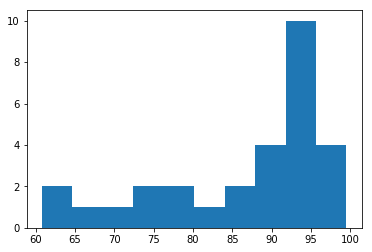

In [19]:
%pylab inline

grades = array((93.5,93,60.8,94.5,82,87.5,91.5,99.5,86,93.5,92.5,78,76,69,94.5,89.5,92.8,78,65.5,98,98.5,92.3,95.5,76,91,95,61.4,96,90))
junk = hist(grades)



## Why not histograms?

Try changing the amount of bins. Can you figure out how many bins you should have for the left side of the data distribution?

Help on function hist in module matplotlib.pyplot:

hist(x, bins=None, range=None, density=None, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, normed=None, *, data=None, **kwargs)
    Plot a histogram.
    
    Compute and draw the histogram of *x*. The return value is a
    tuple (*n*, *bins*, *patches*) or ([*n0*, *n1*, ...], *bins*,
    [*patches0*, *patches1*,...]) if the input contains multiple
    data.
    
    Multiple data can be provided via *x* as a list of datasets
    of potentially different length ([*x0*, *x1*, ...]), or as
    a 2-D ndarray in which each column is a dataset.  Note that
    the ndarray form is transposed relative to the list form.
    
    Masked arrays are not supported at present.
    
    Parameters
    ----------
    x : (n,) array or sequence of (n,) arrays
        Input values, this takes either a single array or a sequence of
        

C:\Users\faizan\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


(array([0.02673082, 0.01336541, 0.        , 0.01336541, 0.        ,
        0.02673082, 0.02673082, 0.        , 0.01336541, 0.01336541,
        0.01336541, 0.05346164, 0.08019246, 0.06682705, 0.04009623]),
 array([60.8 , 63.38, 65.96, 68.54, 71.12, 73.7 , 76.28, 78.86, 81.44,
        84.02, 86.6 , 89.18, 91.76, 94.34, 96.92, 99.5 ]),
 <a list of 15 Patch objects>)

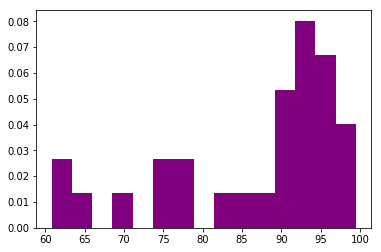

In [21]:
from matplotlib.pyplot import hist
### What are the possible output values from  hist(data, totalframes, normed=1, facecolor='green', alpha=0.0) ?
help(hist)
# try out histogram with 5 bins
hist(data, bins= 15, range=None, density=None, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color='purple', label=None, stacked=False, normed=1, data=None)
## ... your code here

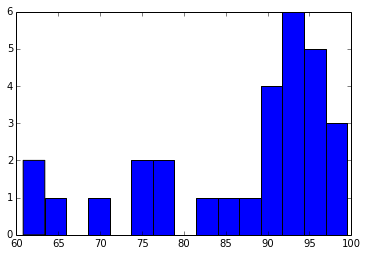

In [3]:
# try out histogram with 35 bins

## ... your code here

Figuring out how many bins you should need can be quit confusing, right?

**What is KDE?**
[ KDE explanation](http://www.mvstat.net/tduong/research/seminars/seminar-2001-05/)

In [22]:
from numpy import array
data_tarn = array((2.1,2.2,2.3,2.25,2.4,2.61,2.62,3.3,3.4,3.41,3.6,3.8))
data_shodor = array((49,49,45,45,41,38,38,38,40,37,37,34,35,36,35,38,38,32,32,32,37,31,32,31,32,30,30,32,30,30,29,28,29,29,29,30,28,27,29,30,28,27,28,27,27,29,29,29,26,27,25,25,25,25,25,25,25,26,26,27))
data_sat = array((490,499,459,575,575,513,382,525,510,542,368,564,509,530,485,521,495,526,474,500,441,750,495,476,456,440,547,479,501,476,457,444,444,467,482,449,464,501,670,740,590,700,590,450,452,468,472,447,520,506,570,474,532,472,585,466,549,736,654,585,574,621,542,616,547,554,514,592,531,550,507,441,551,450,548,589,549,485,480,545,451,448,487,480,540,470,529,445,460,457,560,495,480,430,644,489,506,660,444,551,583,457,440,470,486,413,470,408,440,596,442,544,528,559,505,450,477,557,446,553,370,533,496,513,403,496,543,533,471,404,439,459,393,470,650,512,445,446,474,449,529,538,450,570,499,375,515,445,571,442,492,456,428,536,515,450,537,490,446,410,526,560,560,540,502,642,590,480,557,468,524,445,479))
simple_data = array((0,5,10))
data = grades

Two of the main problems with histograms are (1) you need to define a bin size (2) you need to decide where the left edge of the bin is. 

## Histogram bin size

Let's look at the effects of bin size on histograms. 
Let's start with `getHistBinNumAni`. What does that do? Given a data set, it'll give us an interactive plot. By dragging the slider around, we can make a histogram with anywhere from 1 bin to some max (default: 20) number of bins. No matter how many bins we have, the actual data is shown in blue dots near the bottom. Here's what it looks like for the grades:

In [23]:
from IPython.display import HTML
data = grades


C:\Users\faizan\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: DeprecationWarning: Passing normed=False is deprecated, and has no effect. Consider passing the density argument instead.


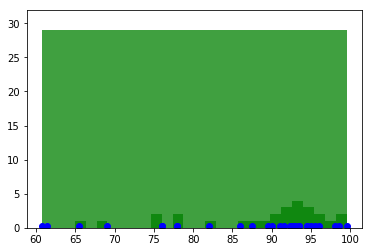

In [24]:
# Run this code
ani = getHistBinNumAni(data)
HTML(ani.to_jshtml())

**So, obviously chosing the number of bins makes a *huge* difference in how we'd interpret the data.**

## Where do the histogram bins start?

One of the other big problems with histograms, especially for relatively small data sets, is that you have to choose where the left edge of the first bin goes. Do you center the bin around the first group of points? Do you make the left edge match up with the left-most data point? Let's make some plots to see how that can affect things, because it's a bit easier to understand what I'm going on about that way. We'll make a similar animation with `getHistBinOffsetAni`. As with the previous animation, drag the slider around. This time, we have the same number of bins, but the slider drags around the data relative to the bins (or vice versa, depending on how you think of it).

C:\Users\faizan\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")
C:\Users\faizan\Anaconda3\lib\site-packages\ipykernel_launcher.py:55: DeprecationWarning: Passing normed=False is deprecated, and has no effect. Consider passing the density argument instead.
C:\Users\faizan\Anaconda3\lib\site-packages\ipykernel_launcher.py:62: DeprecationWarning: Passing normed=False is deprecated, and has no effect. Consider passing the density argument instead.


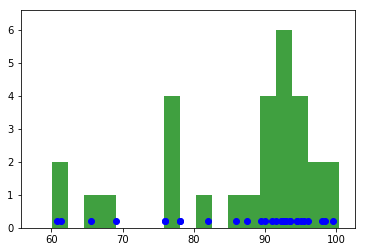

In [25]:
ani2 = getHistBinOffsetAni(data)
HTML(ani2.to_jshtml())

# KDE (Kernel Density Estimation) as a way to solve issues with Histogram

[Kernel density estimation](http://en.wikipedia.org/wiki/Kernel_density_estimation) ís one very good alternative to using histograms. Tarn Duong has [a seminar on KDE explanation](http://www.mvstat.net/tduong/research/seminars/seminar-2001-05/), which is well worth reading. The basic idea is that, if you're looking at our simple dataset (`simple_data = array((0,5,10)`), you might choose to represent each point as a rectangle:


[From Wikipedia](https://en.wikipedia.org/wiki/Kernel_density_estimation) you can find the definition

**In statistics, kernel density estimation (KDE) is a non-parametric way to estimate the probability density function of a random variable. Kernel density estimation is a fundamental data smoothing problem where inferences about the population are made, based on a finite data sample. In some fields such as signal processing and econometrics it is also termed the Parzen–Rosenblatt window method, after Emanuel Parzen and Murray Rosenblatt, who are usually credited with independently creating it in its current form.**

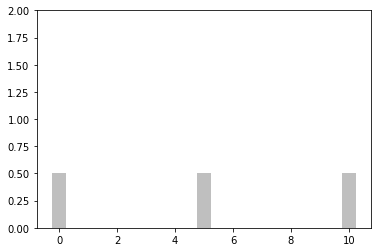

In [26]:
bar(simple_data,ones_like(simple_data)*0.5,width=0.5,facecolor='grey',alpha=0.5)
junk = ylim(0, 2.0)

not so interesting so far, but what do we do when the rectangles get wide enough that they start to overlap? Instead of just letting them run over each other like

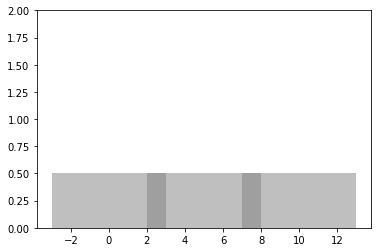

In [27]:
bar(simple_data,ones_like(simple_data)*0.5,width=6,facecolor='grey',alpha=0.5)
junk = ylim(0, 2.0)

and instead of coloring the overlap regions darker grey, we *add* the rectangles together. So, since each of the rectangles has height 0.5 in the above example, the dark grey regions should really have height 1.0. This idea is called "kernel density estimation" (KDE), and the rectangle that we're using is called the "kernel". If we wanted to draw a different shape at each point, we'd do so by specifying a different kernel (perhaps a bell curve, or a triangle). 

KDE, rectangular kernel
-----------------------

Now let's try KDE with a rectangular kernel. This time, using `getKdeRectAni`, you get a slider controls the width of the kernel.

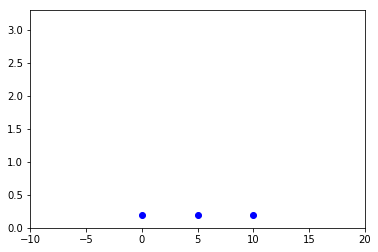

In [28]:
ani3 = getKdeRectAni(simple_data)
HTML(ani3.to_jshtml())

play with the slider, and note what happens when you make it big enough that the rectangles start to overlap. By tuning the width of the rectangles, we can tune how finely or coarsely we're looking at the data. It's not so powerful with three data points, but check it out with the grades from above:

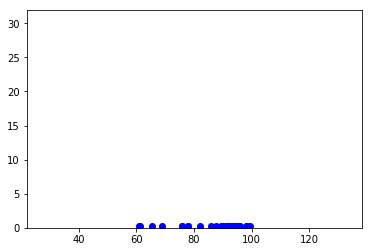

In [29]:
ani4 = getKdeRectAni(data)
HTML(ani4.to_jshtml())

In my view, there's a sweet spot right around 1/8 or 1/9 of the way across the slider where there are three distinct peaks. It looks very much like a trimodal distribution to me. So far, this isn't totally automatic; we have to pick the width of our kernel, but it's obvoius that KDE can give us a much better view of the underlying data than histograms!

KDE, Gaussian kernel
--------------------


As mentioned above, we can use a different kernel. One of the most common kernels to use is a [Gaussian](http://en.wikipedia.org/wiki/Gaussian_function). Using `getKdeGaussianAni`:

 Again, the slider controls kernel width.

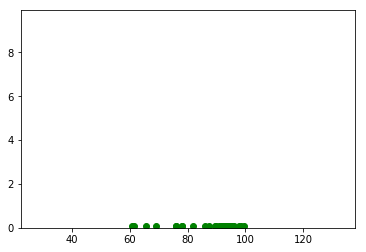

In [30]:
ani5 = getKdeGaussianAni(data)
HTML(ani5.to_jshtml())

This gives us a really nice picture of the data. Play around with the slider and see what you think.

## Kernel width

Not only does KDE give us a better picture than histograms, but there turn out to be actual answers to the question of "how wide should my kernel be?" You can see, for instance, that making the kernel too narrow doesn't provide much more information than the raw data, while making it too large oversmooths the data, making it mostly look like a single kernel with some bits on the sides.

[Daniel Smith](http://partiallattice.wordpress.com/) has a really nice [KDE module](https://github.com/Daniel-B-Smith/KDE-for-SciPy) that chooses an optimal bandwidth and can be used with [SciPy](http://www.scipy.org/) (scipy does have [its own](http://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.gaussian_kde.html) KDE module, but I've found Daniel's to be quite robust).

## Testing Kernels on Income data

Let's grab the income data from [The IRS](http://www.irs.gov/uac/SOI-Tax-Stats---Free-County-Income-Data-Downloads) and make some plots.



In [31]:
import urllib.request as ur
import numpy as np

from urllib.request import urlopen

def decode_htmL_from_url(url="http://www.irs.gov/file_source/pub/irs-soi/09incicsv.csv"):
    with urlopen(url) as response:
        html_response = response.read()
        encoding = response.headers.get_content_charset('latin-1')
        decoded_html = html_response.decode(encoding)
    return decoded_html

decoded = decode_htmL_from_url()
filename = "decoded.txt"
f = open(filename, 'wt', encoding='utf-8')
f.write(decoded)
#"State_Code","County_Code","State_Abbrv","County_Name",   "Return_Num","Exmpt_Num","AGI","Wages_Salaries","Dividends","Interest"
irs2009 = np.loadtxt(filename,delimiter=',',skiprows=1,usecols=(4,5,6,7,8,9),dtype=int)
agi2009 = irs2009[:,2]
#type(irs2009)
print(agi2009)

[85675848  1028586  3591479 ...   460437   175841   164792]


Now try things like

env_config.py:22: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  junk = plot(data,0.2*ones_like(data),'bo')
env_config.py:26: DeprecationWarning: Passing normed=False is deprecated, and has no effect. Consider passing the density argument instead.
  ax.set_ylim(0,1.1*n.max())


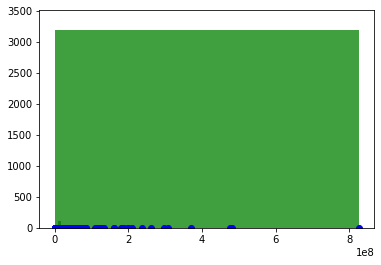

In [68]:
ani6 = getHistBinNumAni(agi2009)
HTML(ani6.to_jshtml())

Whoops, that's hard to make sense of. Let's use logs

In [32]:
la2009 = log(agi2009)
la2009 = la2009[~isnan(la2009)]

C:\Users\faizan\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log
  """Entry point for launching an IPython kernel.


C:\Users\faizan\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")
C:\Users\faizan\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: DeprecationWarning: Passing normed=False is deprecated, and has no effect. Consider passing the density argument instead.


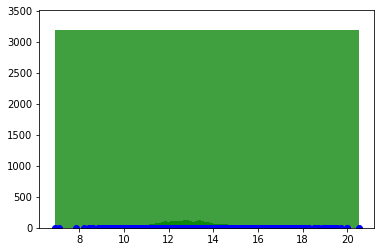

In [33]:
ani7 = getHistBinNumAni(la2009)
HTML(ani7.to_jshtml())

In [80]:
help(getKdeRectAni)

Help on function getKdeRectAni in module __main__:

getKdeRectAni(data, totalframes=100, showpts=True)
    #FACTOR ME for rect and gaussian



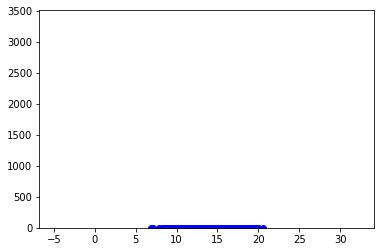

In [36]:
ani8 = getKdeRectAni(la2009)
HTML(ani8.to_jshtml())

Help on function getKdeGaussianAni in module __main__:

getKdeGaussianAni(data, totalframes=100, showpts=True)



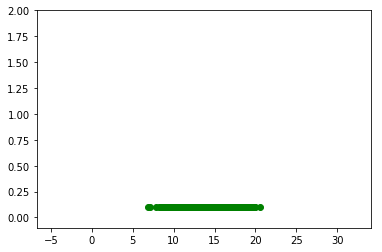

In [37]:
help(getKdeGaussianAni)
ani9 = getKdeGaussianAni(la2009)
#HTML(ani9.to_jshtml())

[Reference](https://mglerner.github.io/posts/histograms-and-kernel-density-estimation-kde-2.html?p=28)

# Tasks : You may divide them, but each student in the pair should understand solutions to all tasks

## Task 0 : Compare the  benefits and drawbacks of Using Kernels VS Histograms for understanding 1 variable.


## Task 1 :  Understanding Animation Implementation

Collaborate together with your pair student to come up with a unified description of how the previously used function works

def getKdeGaussianAni(data,totalframes=100, showpts=True):
    fig = figure()
    
    # Let's say 10000 points for the whole thing
    width = data.max() - data.min()
    left, right = data.min(), data.min() + (width)
    left, right = left - (totalframes/100)*width, right + (totalframes/100)*width
    
    ax = axes(xlim=(left,right),ylim=(-0.1,2))
    line, = ax.plot([], [], lw=2)
    if showpts:
        junk = plot(data,ones_like(data)*0.1,'go')

    
    numpts = 10000
    x = linspace(left,right,numpts)
    
    dx = (right-left)/(numpts-1)
    
    def init():
        line.set_data([], [])
        return line,
    
    def gaussian(x,sigma,mu):
        # Why isn't this defined somewhere?! It must be!
        return (1/sqrt(2*pi*sigma**2)) *  exp(-((x-mu)**2)/(2*sigma**2))
    
    def animate(i):
        y = zeros(10000)
        kernelwidth = .02*width*(i+1)
        kernelpts = int(kernelwidth/dx)
        kernel = gaussian(linspace(-3,3,kernelpts),1,0)
        #kernel = ones(kernelpts)
        for d in data:
            center = d - left
            centerpts = int(center/dx)
            bottom = centerpts - int(kernelpts/2)
            top = centerpts+int(kernelpts/2)
            if top - bottom < kernelpts: top = top + 1
            if top - bottom > kernelpts: top = top - 1
            y[bottom:top] += kernel
        ax.set_xlim(x[where(y>0)[0][0]],x[where(y>0)[0][-1]])
        line.set_data(x,y)
        ax.set_ylim(min(0,y.min()),1.1*y.max())
        #title('ymin %s ymax %s'%(y.min(),y.max()))

    
        #sleep(0.1)
        return line,
    ani = animation.FuncAnimation(fig, animate, init_func=init,
                                  frames=totalframes, repeat=False)
    return ani

## Task 2 : Your First Custom Kernel. 

Together with your pair student: Come up and implement your own custom kernel and use that to estimate the distribution of the 4'th feature in the previously used `Salary` dataset. Compare the result with `Gaussian` and `Uniform` or `Matern` kernels from the animation defined in this notebook. Write down your observations in a report. Submit it in Markdown format as part of the submission.
**Don't use** any common kernel such as `uniform`, `Gaussian` or others as outlined [on this image](https://www.researchgate.net/profile/Jui-Sheng_Chou/publication/239386696/figure/tbl2/AS:667912230674445@1536254093339/SVM-Kernel-Function-Types.png)

**HINT**: If you have no ideas where to start, take a look at [slide 5 here](http://www.ra.cs.uni-tuebingen.de/lehre/ss12/advanced_ml/lecture3.pdf) and analyze these functions. First you should prove that the function is a kernel (refer to task 3, then you can use it in this task as well). Only work together with your pair student.

## Task 3 : Prove that the custom function implemented in the previous task is actually a kernel.
You may use Markdown to write mathematical formulae there or do it by hand and take a picture of the proof. You may use [Slide 31 of this presentation](http://www.ra.cs.uni-tuebingen.de/lehre/ss12/advanced_ml/lecture3.pdf) as a starting point for requirements.

## Task 4 : Recapping Kernel Methods

**Please read and do the following**:
  
[Kernel methods](https://en.wikipedia.org/wiki/Kernel_method) and write in your own words what is **kernel method** and where are they used in machine learning. Minimum 10 sentences.



## Task 5 : Bonus (bonus points for distinction track) Task 5 (for those who have completed the rest):  Mathematics for Kernels with Gaussian Processes over SVMs

Read [This article](https://pdfs.semanticscholar.org/e837/f153e86d4c0a580a22df07a5140c4259530d.pdf) Using this presentation, explain why should you use Gaussian Processes instead of SVMs. 

How to write: 
* Use only your own wording. Every term that you introduce should be defined.
* If you need to refere to formulae, write these formulae out either by hand or in Markdown
* Explain also the graph on page 18